## Code to make on/off subfield figures for platform paper

In [78]:
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from allen_v1dd.client import OPhysClient

from allen_v1dd.stimulus_analysis import LocallySparseNoise

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [39]:
client = OPhysClient("/home/naomi/Desktop/data/V1dd_nwbs/")

mouse_id = "M427836"
col_vol_str = "23"
plane = 1

session = client.load_ophys_session(f"{mouse_id}_{col_vol_str}")
lsn = LocallySparseNoise(session, plane, trace_type='events')

In [40]:
def get_whitening_stats(pixels_on, pixels_off, lsn):
    pixels = pixels_on + pixels_off
    pixels = pixels - (lsn.pixel_on / 2) # center pixels around 127.5
    flattened_pixels = pixels.reshape(-1, pixels.shape[2])  # (n_pixels, n_sweeps)

    mu = np.mean(flattened_pixels, axis=1, keepdims=True)
    centered_pixels = flattened_pixels - mu  # shape (n_pixels, n_sweeps
    cov_matrix = np.cov(centered_pixels)  # shape (n_pixels, n_pixels)

    return mu, cov_matrix

In [41]:
def whiten_stas(mu, cov_matrix, on_sta, off_sta, lam=1e-3):

    centered_on_sta = on_sta.flatten() - mu.flatten()
    centered_off_sta = off_sta.flatten() - mu.flatten()

    A = cov_matrix + lam * np.eye(cov_matrix.shape[0])
    k_on = np.linalg.solve(A, centered_on_sta)  # whitened STA
    k_off = np.linalg.solve(A, centered_off_sta)  # whitened STA

    return k_on.reshape(lsn.image_shape), k_off.reshape(lsn.image_shape)


In [42]:
def get_stas(session, plane, trace_type='events', whiten=True, shuffle=False):
    
    lsn = LocallySparseNoise(session, plane, trace_type=trace_type)
    design_matrix_int = lsn.design_matrix.astype(int)         # get design matrix (2*n_pixels, n_sweeps)

    if shuffle:
        np.random.seed(0)
        np.random.shuffle(design_matrix_int.T)  # shuffle along sweeps
        assert design_matrix_int.shape == lsn.design_matrix.shape, "shuffling changed design matrix shape!"

    pixels_on = design_matrix_int[:design_matrix_int.shape[0]//2, :].reshape(*lsn.image_shape, design_matrix_int.shape[1])  # on pixels
    pixels_on = np.select([pixels_on==1, pixels_on==0], [lsn.pixel_on, lsn.pixel_on / 2], pixels_on)

    pixels_off = design_matrix_int[design_matrix_int.shape[0]//2:, :].reshape(*lsn.image_shape, design_matrix_int.shape[1])  # off pixels
    pixels_off = np.select([pixels_off==1, pixels_off==0], [lsn.pixel_off, lsn.pixel_on / 2], pixels_off)

    roi_array = np.arange(0, lsn.n_rois, 1)
    valid_roi_array = roi_array[lsn.is_roi_valid] # get valid rois only

    stas = np.zeros((lsn.n_rois_valid, *lsn.image_shape, 2))  # initialize stas array; only for valid rois

    # the collection of stimuli presented, flattened for whitening
    if whiten:
        mu, cov_matrix = get_whitening_stats(pixels_on, pixels_off, lsn)

    for idx, roi in enumerate(valid_roi_array):
        on_sta = (pixels_on * lsn.sweep_responses[:, roi]).sum(axis=2) / lsn.sweep_responses[:, roi].sum()
        off_sta = (pixels_off * lsn.sweep_responses[:, roi]).sum(axis=2) / lsn.sweep_responses[:, roi].sum()
        
        if whiten:
            on_sta, off_sta = whiten_stas(mu, cov_matrix, on_sta, off_sta, roi)

        stas[idx, :, :, 0] = on_sta
        stas[idx, :, :, 1] = off_sta

    return stas

In [43]:
import scipy.optimize as opt

def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()

def fit_gaussian(data, type=None):
    '''
    data: 2D numpy array (lsn.image_shape) of average response to ON or OFF pixels
    ''' 

    # Figure out initial guess parameters
    if type is None:
        idx = np.argmax(np.abs(data))
    elif type == 'on':
        idx = np.argmax(data)
    elif type == 'off':
        idx = np.argmin(data)
        
    x0_0, y0_0 = idx % data.shape[1], idx // data.shape[1]
    A0 = data[y0_0, x0_0] - np.median(data)
    B0 = np.median(data)
    initial_guess = (A0, x0_0, y0_0, 1, 1, 0, B0)

    # Create x and y coordinate arrays
    x = np.arange(data.shape[1])
    y = np.arange(data.shape[0])
    x, y = np.meshgrid(x, y)

    # Try fitting the Gaussian model to the data
    try:
        popt, pcov = opt.curve_fit(twoD_Gaussian, (x, y), data.reshape(-1), p0=initial_guess, maxfev=100000)

        fitted_data = twoD_Gaussian((x, y), *popt).reshape(data.shape)

        resid = data - fitted_data
        ss_res = np.sum(resid**2)
        ss_tot = np.sum((data - data.mean())**2) + 1e-12
        r2 = 1 - ss_res / ss_tot

        return popt, pcov, fitted_data, r2
    except:
        return None, None, np.zeros_like(data), None

In [79]:
def get_gauss_subfields(session, plane, trace_type='events', whiten=False, shuffle=False):

    stas = get_stas(session, plane, trace_type=trace_type, whiten=whiten, shuffle=shuffle)

    gauss_results = {
        'on': {
            'roi': [],
            'params': [],
            'covariances': [],
            'fitted_stas': [],
            'r2_values': []
        },
        'off': {
            'roi': [],
            'params': [],
            'covariances': [],
            'fitted_stas': [],
            'r2_values': []
        }
    }

    receptive_fields = np.zeros((lsn.n_rois, 2, *lsn.image_shape), dtype=float)
    
    for idx in range(stas.shape[0]):
        on_sta = stas[idx, :, :, 0]
        off_sta = stas[idx, :, :, 1]

        popt_on, pcov_on, fitted_on, r2_on = fit_gaussian(on_sta, type='on')
        popt_off, pcov_off, fitted_off, r2_off = fit_gaussian(off_sta, type='off')

        # Store or process the fitted parameters as needed
        gauss_results['on']['roi'].append(on_sta)
        gauss_results['on']['params'].append(popt_on)
        gauss_results['on']['covariances'].append(pcov_on)
        gauss_results['on']['fitted_stas'].append(fitted_on)
        gauss_results['on']['r2_values'].append(r2_on)

        gauss_results['off']['roi'].append(off_sta)
        gauss_results['off']['params'].append(popt_off)
        gauss_results['off']['covariances'].append(pcov_off)
        gauss_results['off']['fitted_stas'].append(fitted_off)
        gauss_results['off']['r2_values'].append(r2_off)

        receptive_fields[idx, 0, :, :] = fitted_on
        receptive_fields[idx, 1, :, :] = fitted_off
    
    receptive_fields[~lsn.is_roi_valid, :, :, :] = 0  # set invalid rois to 0

    return gauss_results, receptive_fields, stas

In [80]:
# stas = get_stas(session, plane, trace_type='events', whiten=False)
# print(stas.shape)

gauss_results, receptive_fields, stas = get_gauss_subfields(session, plane, trace_type='events', whiten=True, shuffle=False)

/home/naomi/anaconda3/envs/v1dd-public-2/lib/python3.10/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [81]:
receptive_fields.shape

(1173, 2, 8, 14)

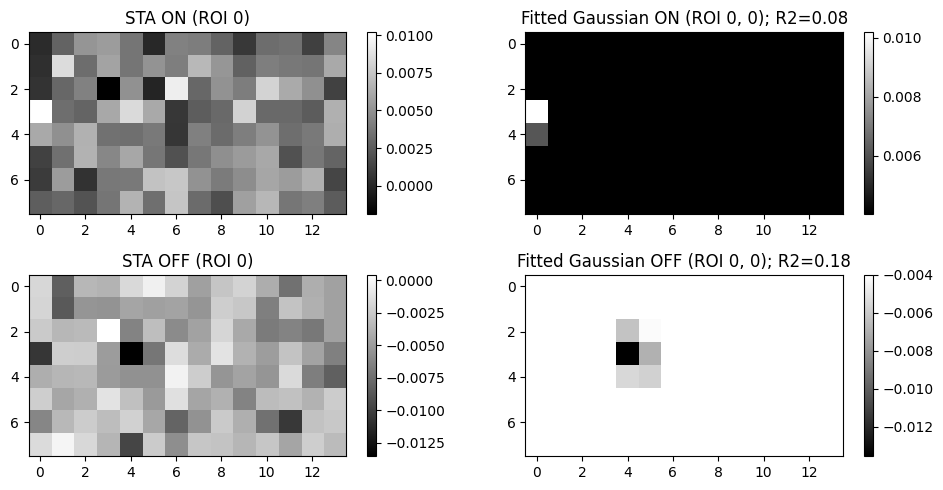

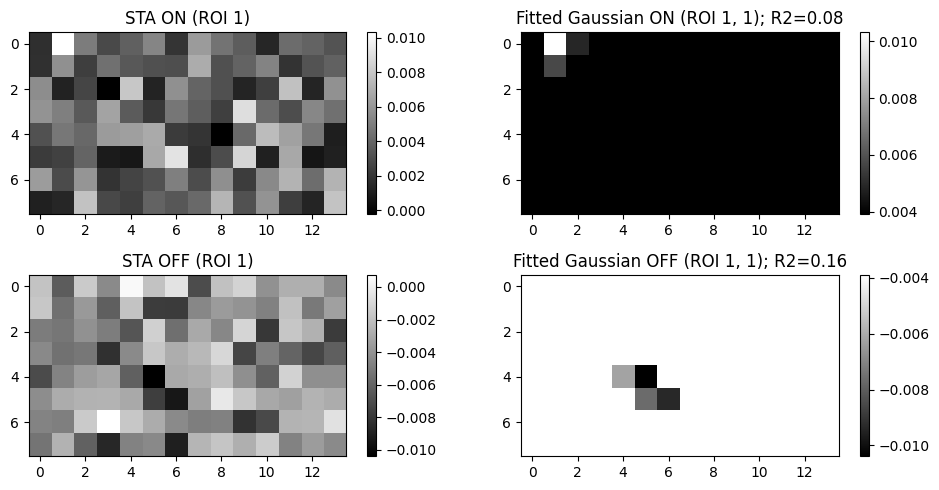

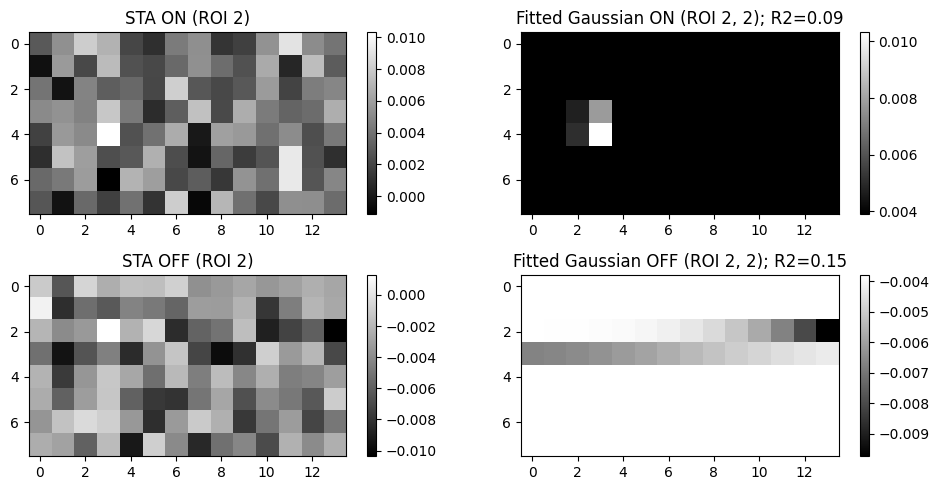

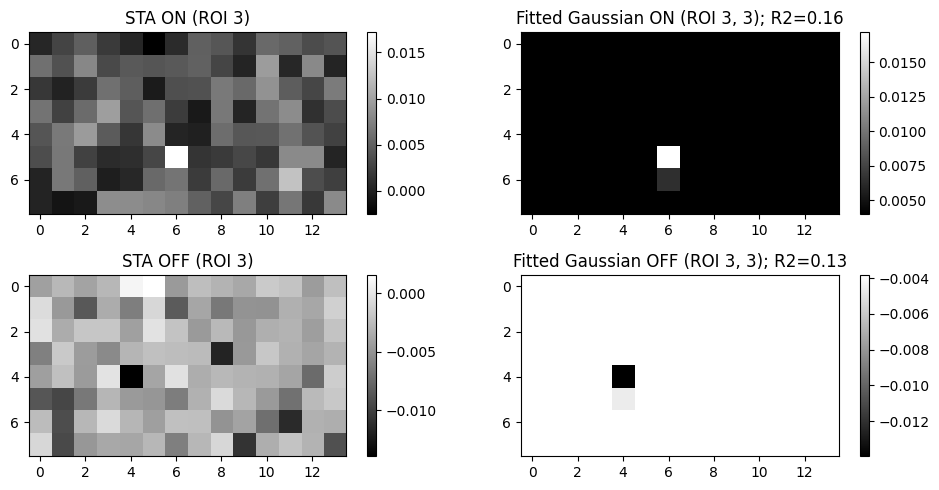

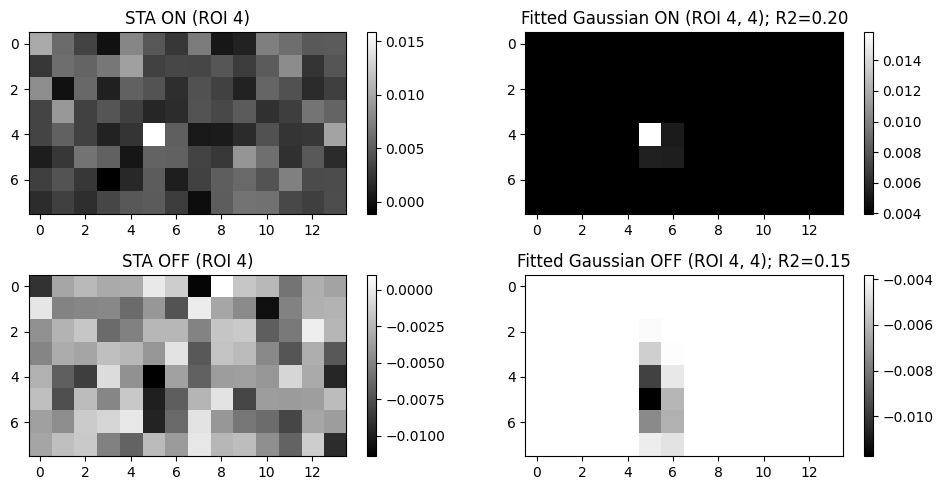

In [82]:
rois = np.arange(lsn.n_rois)
valid_rois = rois[lsn.is_roi_valid]

for roi in range(5):  # visualize first 5 rois
    fig, axs = plt.subplots(2, 2, figsize=(10, 5))

    on_sta = stas[roi, :, :, 0]
    off_sta = stas[roi, :, :, 1]

    sub = axs[0, 0].imshow(on_sta, cmap='gray')
    axs[0, 0].set_title(f"STA ON (ROI {roi})")
    fig.colorbar(sub, ax=axs[0, 0], fraction=0.03)

    sub = axs[1, 0].imshow(off_sta, cmap='gray')
    axs[1, 0].set_title(f"STA OFF (ROI {roi})")
    fig.colorbar(sub, ax=axs[1, 0], fraction=0.03)

    fitted_on = gauss_results['on']['fitted_stas'][roi]
    fitted_off = gauss_results['off']['fitted_stas'][roi]
    r2_on = gauss_results['on']['r2_values'][roi] if gauss_results['on']['r2_values'][roi] is not None else 0
    r2_off = gauss_results['off']['r2_values'][roi] if gauss_results['off']['r2_values'][roi] is not None else 0

    sub = axs[0, 1].imshow(fitted_on, cmap='gray')
    axs[0, 1].set_title(f"Fitted Gaussian ON (ROI {roi}, {valid_rois[roi]}); R2={r2_on:.2f}")
    fig.colorbar(sub, ax=axs[0, 1], fraction=0.03)

    sub = axs[1, 1].imshow(fitted_off, cmap='gray')
    axs[1, 1].set_title(f"Fitted Gaussian OFF (ROI {roi}, {valid_rois[roi]}); R2={r2_off:.2f}")
    fig.colorbar(sub, ax=axs[1, 1], fraction=0.03)
    plt.tight_layout()

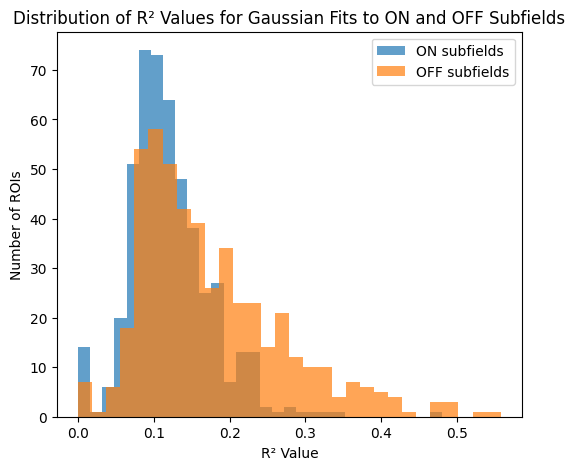

In [35]:
## look at R2 distributions
r2_on_values = [r2 if r2 is not None else 0 for r2 in gauss_results['on']['r2_values']]
r2_off_values = [r2 if r2 is not None else 0 for r2 in gauss_results['off']['r2_values']]

plt.figure(figsize=(6, 5))
plt.hist(r2_on_values, bins=30, alpha=0.7, label='ON subfields')
plt.hist(r2_off_values, bins=30, alpha=0.7, label='OFF subfields')
plt.xlabel('R² Value')
plt.ylabel('Number of ROIs')
plt.title('Distribution of R² Values for Gaussian Fits to ON and OFF Subfields')
plt.legend()

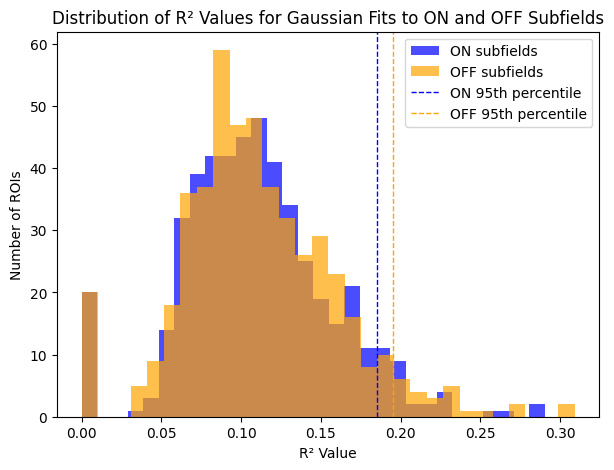

In [32]:
## look at R2 distributions
r2_on_values = [r2 if r2 is not None else 0 for r2 in gauss_results['on']['r2_values']]
r2_off_values = [r2 if r2 is not None else 0 for r2 in gauss_results['off']['r2_values']]

r2_95th_percentile_on = np.percentile(r2_on_values, 95)
r2_95th_percentile_off = np.percentile(r2_off_values, 95)

plt.figure(figsize=(7, 5))
plt.hist(r2_on_values, bins=30, alpha=0.7, color='blue', label='ON subfields')
plt.hist(r2_off_values, bins=30, alpha=0.7, color='orange', label='OFF subfields')

plt.axvline(r2_95th_percentile_on, color='blue', linestyle='dashed', linewidth=1, label='ON 95th percentile')
plt.axvline(r2_95th_percentile_off, color='orange', linestyle='dashed', linewidth=1, label='OFF 95th percentile')

plt.xlabel('R² Value')
plt.ylabel('Number of ROIs')
plt.title('Distribution of R² Values for Gaussian Fits to ON and OFF Subfields')
plt.legend()

/tmp/ipykernel_1240680/1615932976.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(2, 2, figsize=(10, 5))


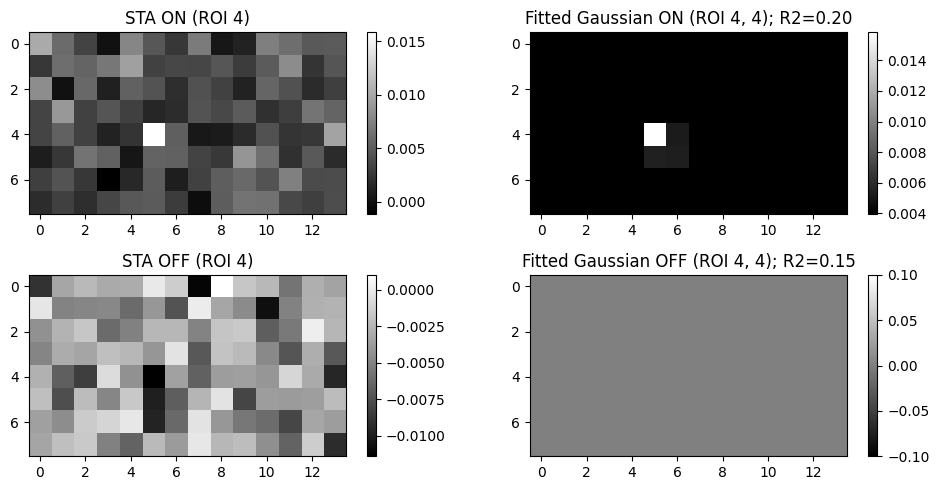

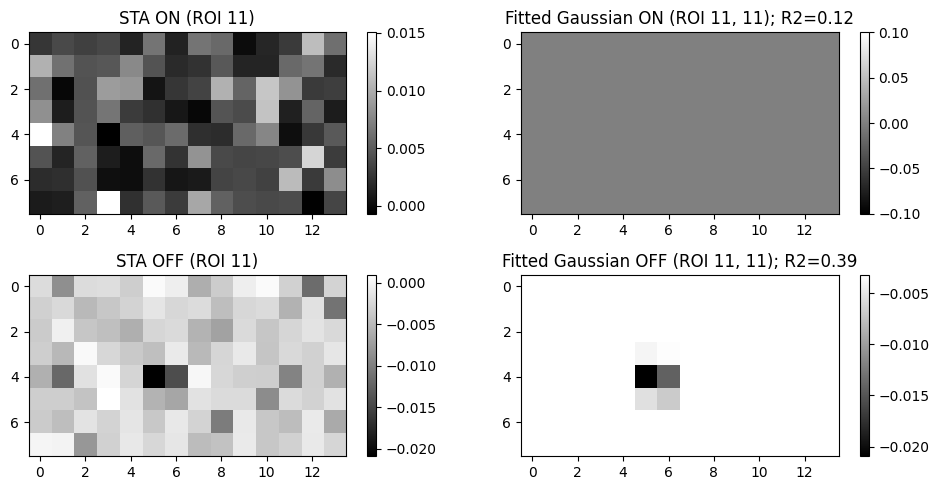

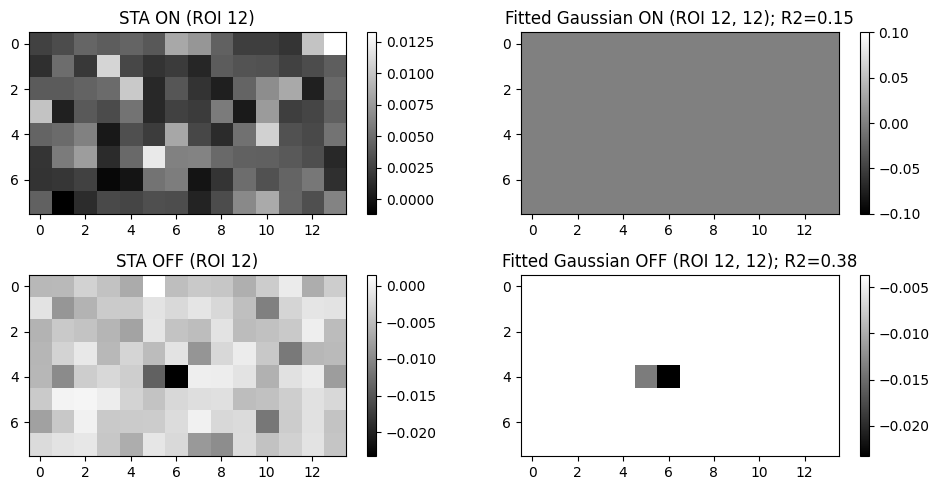

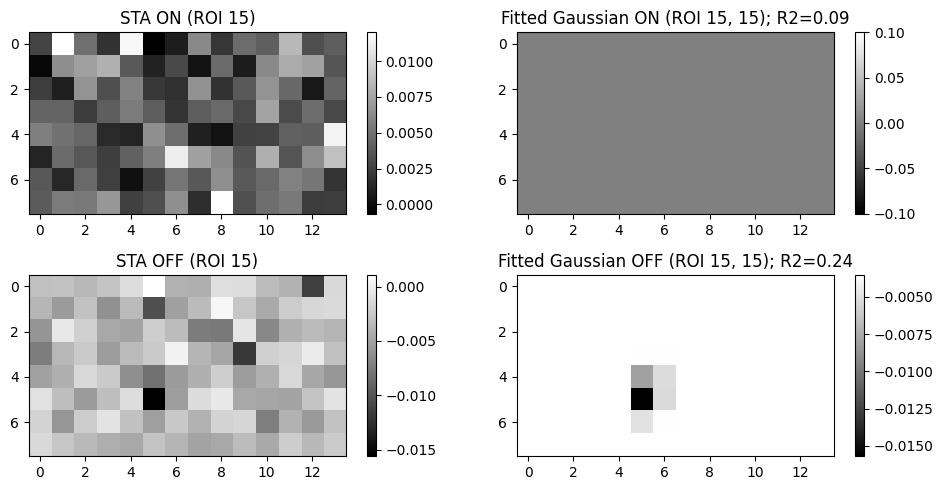

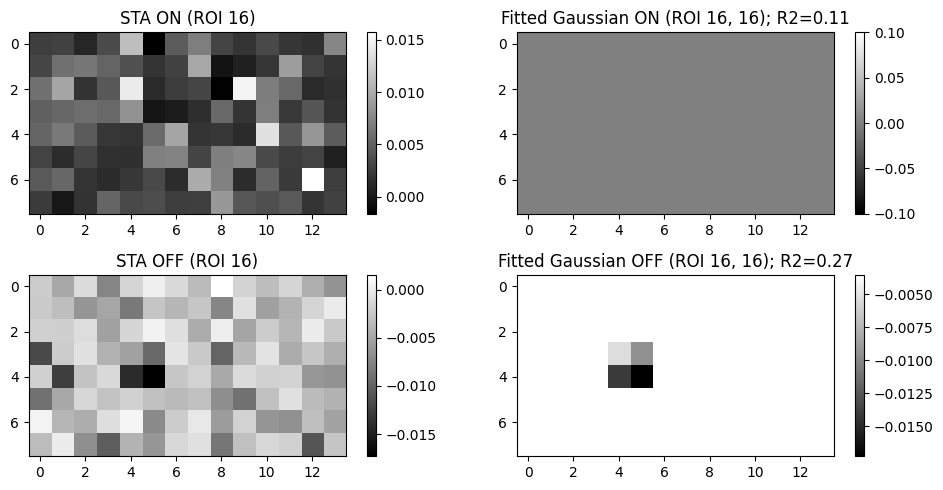

...

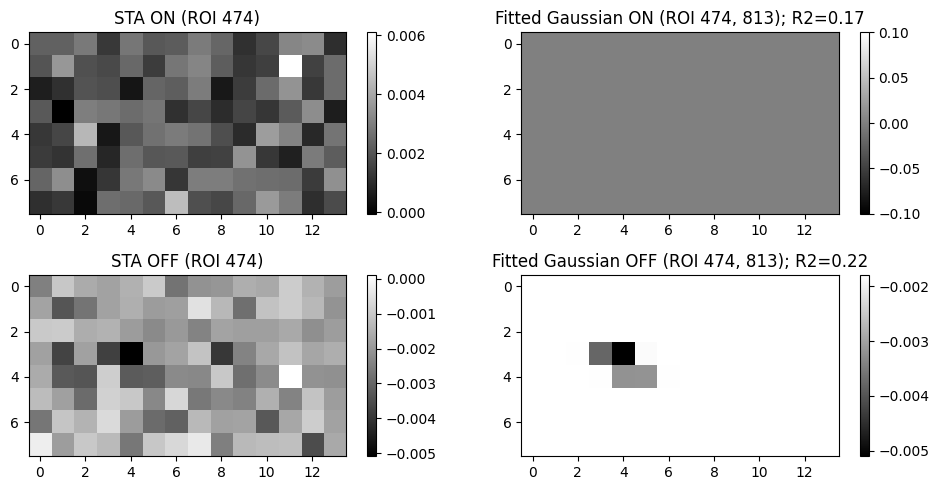

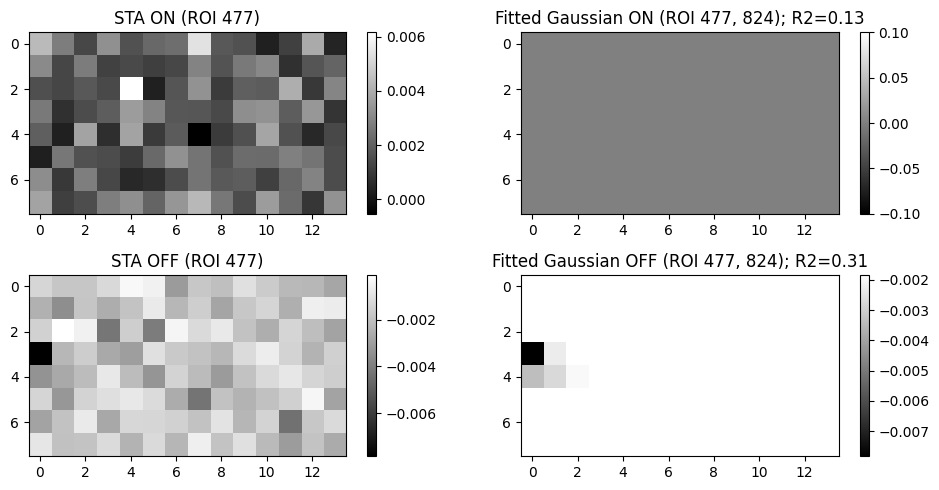

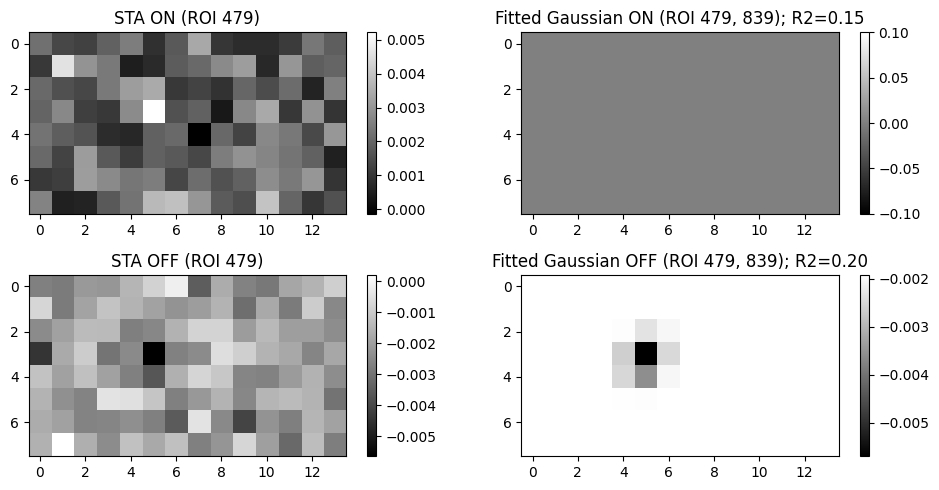

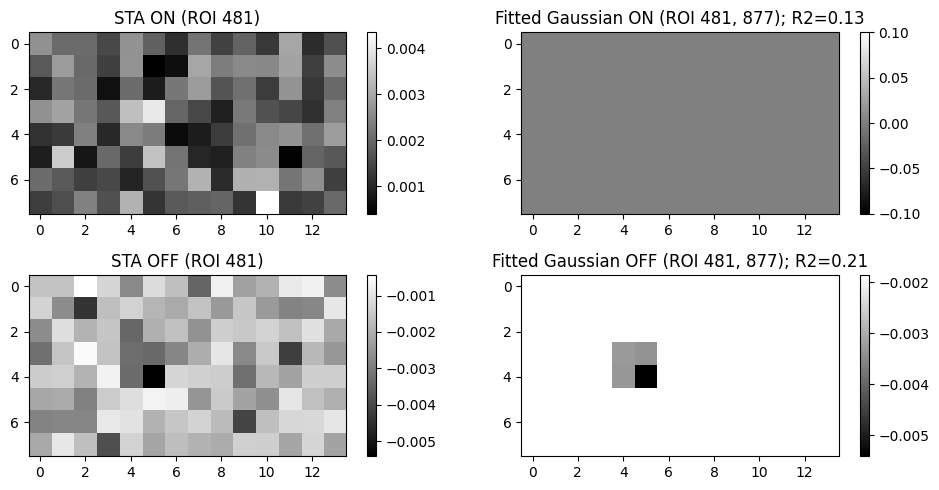

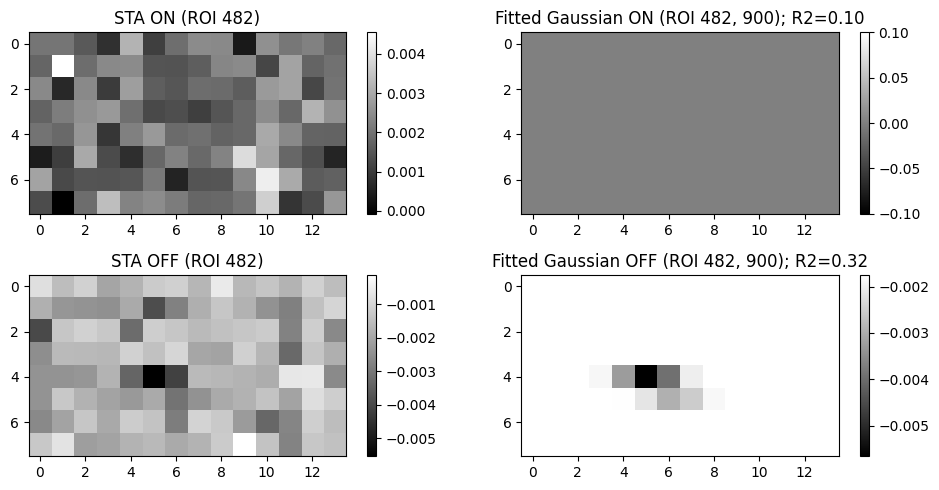

In [47]:
rois = np.arange(lsn.n_rois)
valid_rois = rois[lsn.is_roi_valid]

for roi in range(len(valid_rois)):  # visualize first 5 rois
    
    on_sta = stas[roi, :, :, 0]
    off_sta = stas[roi, :, :, 1]
    fitted_on = gauss_results['on']['fitted_stas'][roi]
    fitted_off = gauss_results['off']['fitted_stas'][roi]
    r2_on = gauss_results['on']['r2_values'][roi] if gauss_results['on']['r2_values'][roi] is not None else 0
    r2_off = gauss_results['off']['r2_values'][roi] if gauss_results['off']['r2_values'][roi] is not None else 0

    if r2_on > r2_95th_percentile_on or r2_off > r2_95th_percentile_off:
        fig, axs = plt.subplots(2, 2, figsize=(10, 5))

        if r2_on < r2_95th_percentile_on:
            fitted_on = np.zeros_like(on_sta)
        
        if r2_off < r2_95th_percentile_off:
            fitted_off = np.zeros_like(off_sta)

        sub = axs[0, 0].imshow(on_sta, cmap='gray')
        axs[0, 0].set_title(f"STA ON (ROI {roi})")
        fig.colorbar(sub, ax=axs[0, 0], fraction=0.03)

        sub = axs[1, 0].imshow(off_sta, cmap='gray')
        axs[1, 0].set_title(f"STA OFF (ROI {roi})")
        fig.colorbar(sub, ax=axs[1, 0], fraction=0.03)

        sub = axs[0, 1].imshow(fitted_on, cmap='gray')
        axs[0, 1].set_title(f"Fitted Gaussian ON (ROI {roi}, {valid_rois[roi]}); R2={r2_on:.2f}")
        fig.colorbar(sub, ax=axs[0, 1], fraction=0.03)

        sub = axs[1, 1].imshow(fitted_off, cmap='gray')
        axs[1, 1].set_title(f"Fitted Gaussian OFF (ROI {roi}, {valid_rois[roi]}); R2={r2_off:.2f}")
        fig.colorbar(sub, ax=axs[1, 1], fraction=0.03)
        plt.tight_layout()

In [48]:
r2_on_values = [r2 if r2 is not None else 0 for r2 in gauss_results['on']['r2_values']]
r2_off_values = [r2 if r2 is not None else 0 for r2 in gauss_results['off']['r2_values']]

r2_on_values_sig = [r2 for r2 in r2_on_values if r2 > r2_95th_percentile_on]
r2_off_values_sig = [r2 for r2 in r2_off_values if r2 > r2_95th_percentile_off]

print(f"Proportion of significant ON subfields: {len(r2_on_values_sig)}/{len(r2_on_values)} = {len(r2_on_values_sig)/len(r2_on_values):.2f}")
print(f"Proportion of significant OFF subfields: {len(r2_off_values_sig)}/{len(r2_off_values)} = {len(r2_off_values_sig)/len(r2_off_values):.2f}")

Proportion of significant ON subfields: 50/484 = 0.10
Proportion of significant OFF subfields: 166/484 = 0.34


## trying to merge with cell_info ?

In [74]:
lsn.receptive_field()

AttributeError: 'LocallySparseNoise' object has no attribute 'receptive_field'

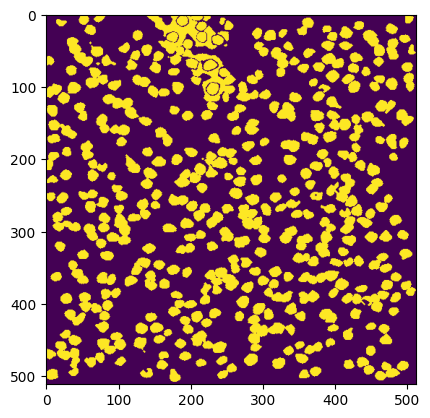

In [71]:
plt.imshow(session.get_roi_image_mask(plane, roi=np.arange(lsn.n_rois)[lsn.is_roi_valid]))

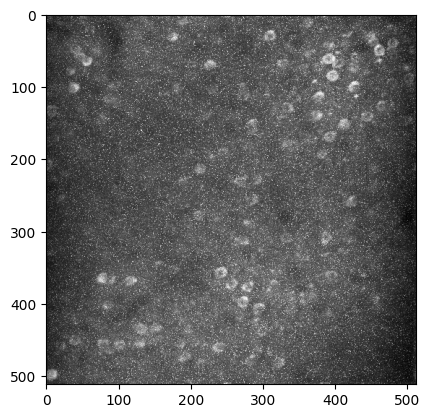

In [73]:
proj_raw_mean, proj_raw_max, proj_denoised_mean, proj_denoised_max, proj_denoised_corr = session.get_plane_projection_images(plane)
plt.imshow(proj_raw_max, cmap='gray')

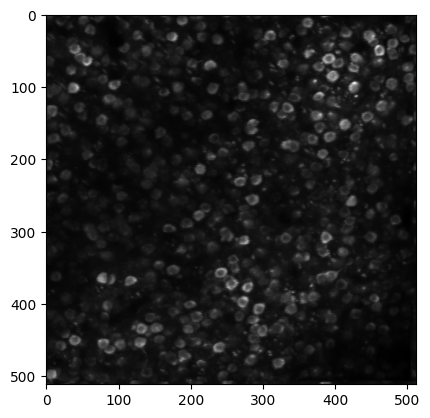

In [72]:
plt.imshow(proj_denoised_max, cmap='gray')